2.1理论计算题

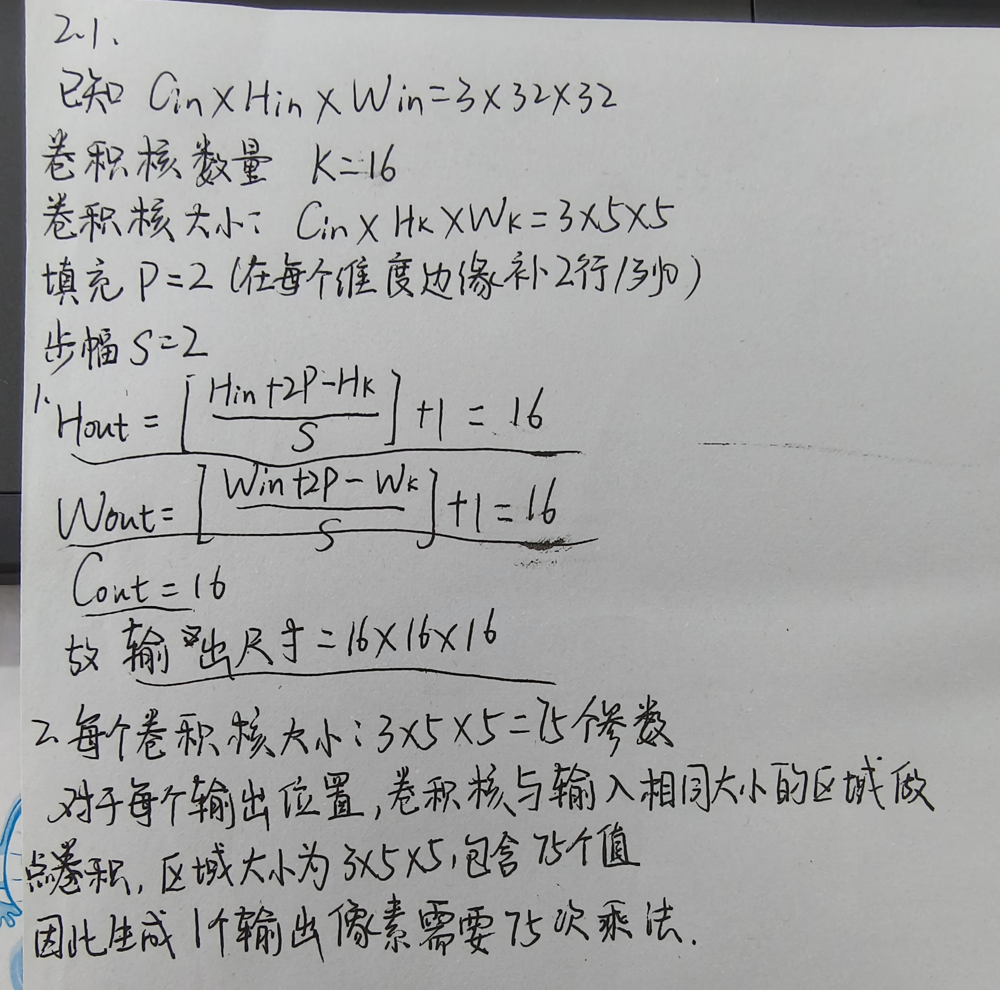

2.2编程题

In [17]:
import numpy as np

def max_pool2d_forward(x, kernel_size, stride=None, padding=0):
    
    # 输入形状
    batch_size, channels, h_in, w_in = x.shape

    # 处理 kernel_size
    if isinstance(kernel_size, int):
        kh, kw = kernel_size, kernel_size
    else:
        kh, kw = kernel_size

    # 处理 stride
    if stride is None:
        sh, sw = kh, kw
    elif isinstance(stride, int):
        sh, sw = stride, stride
    else:
        sh, sw = stride

    # 处理 padding
    if isinstance(padding, int):
        ph, pw = padding, padding
    else:
        ph, pw = padding

    # 计算输出尺寸
    h_out = (h_in + 2 * ph - kh) // sh + 1
    w_out = (w_in + 2 * pw - kw) // sw + 1

    # 填充输入（使用 constant padding，默认补 0）
    x_padded = np.pad(x, ((0, 0), (0, 0), (ph, ph), (pw, pw)), mode='constant', constant_values=0)

    # 初始化输出
    out = np.zeros((batch_size, channels, h_out, w_out))

    # 滑动窗口取最大值
    for i in range(h_out):
        for j in range(w_out):
            # 当前窗口位置
            h_start = i * sh
            h_end = h_start + kh
            w_start = j * sw
            w_end = w_start + kw

            # 窗口区域
            window = x_padded[:, :, h_start:h_end, w_start:w_end]
            # 取最大值（沿窗口高、宽两个维度）
            out[:, :, i, j] = np.max(window, axis=(2, 3))

    return out

测试用例

In [18]:
if __name__ == "__main__":
    # 输入 (batch=1, channel=1, height=4, width=4)
    x = np.array([[
        [[1, 2, 3, 4],
         [5, 6, 7, 8],
         [9, 10, 11, 12],
         [13, 14, 15, 16]]
    ]])

    # 池化：k=2, stride=2, padding=0
    out = max_pool2d_forward(x, kernel_size=2, stride=2, padding=0)
    print("无填充，步幅2：\n", out[0, 0])

    # 池化：k=2, stride=1, padding=1
    out = max_pool2d_forward(x, kernel_size=2, stride=1, padding=1)
    print("\npadding=1，步幅1：\n", out[0, 0])

无填充，步幅2：
 [[ 6.  8.]
 [14. 16.]]

padding=1，步幅1：
 [[ 1.  2.  3.  4.  4.]
 [ 5.  6.  7.  8.  8.]
 [ 9. 10. 11. 12. 12.]
 [13. 14. 15. 16. 16.]
 [13. 14. 15. 16. 16.]]


3.1理论计算题

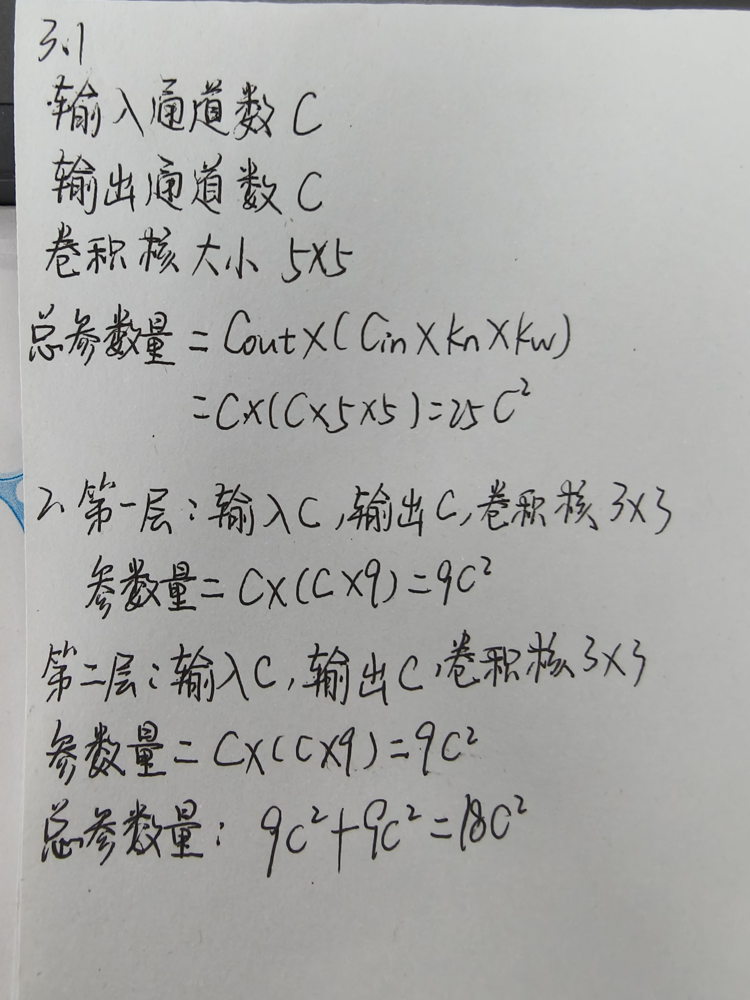

3.2编程题

In [19]:
import torch
import torch.nn as nn

class NiNBlock(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, stride, padding):
        super(NiNBlock, self).__init__()
        self.block = nn.Sequential(
            # 普通卷积层
            nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding),
            nn.ReLU(inplace=True),
            # 第一个 1x1 卷积层
            nn.Conv2d(out_channels, out_channels, kernel_size=1),
            nn.ReLU(inplace=True),
            # 第二个 1x1 卷积层
            nn.Conv2d(out_channels, out_channels, kernel_size=1),
            nn.ReLU(inplace=True)
        )
    
    def forward(self, x):
        return self.block(x)



block = NiNBlock(3, 96, kernel_size=5, stride=1, padding=2)
x = torch.randn(1, 3, 32, 32)
out = block(x)
print(out.shape)  # 输出: torch.Size([1, 96, 32, 32])

torch.Size([1, 96, 32, 32])


4.1理论计算题

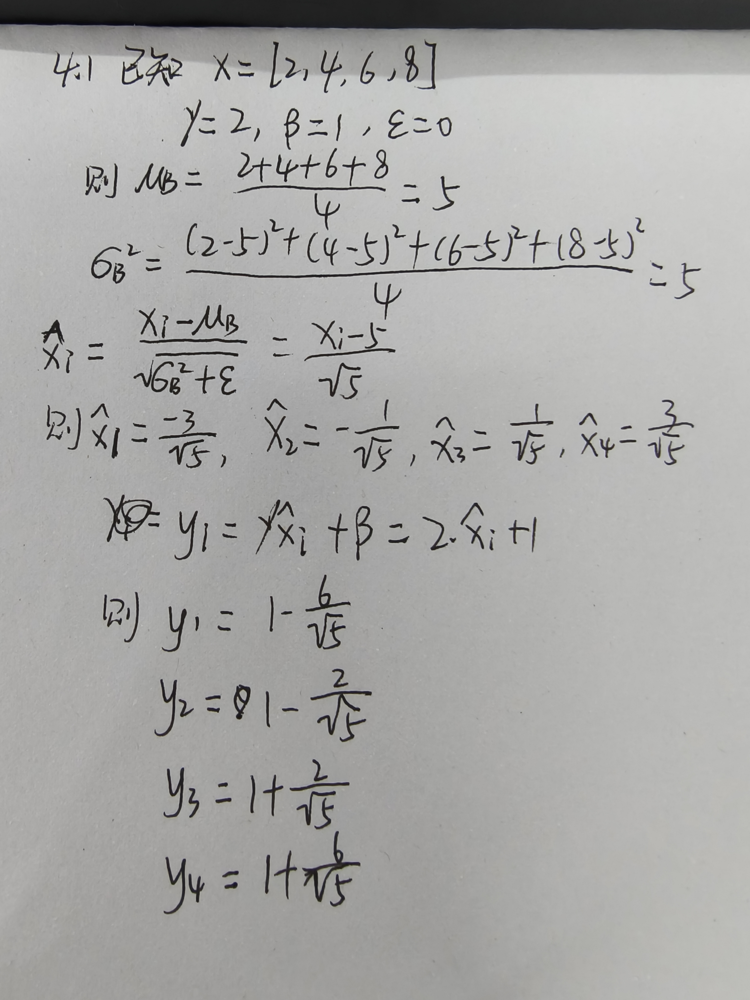

4.2编程题

In [20]:
import torch
import torch.nn as nn

class Residual(nn.Module):
    def __init__(self, in_channels, out_channels, use_1x1conv=False, stride=1):
        super(Residual, self).__init__()
        
        # 第一个卷积层：3x3，步幅为 stride（用于下采样）
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=stride, padding=1)
        self.bn1 = nn.BatchNorm2d(out_channels)
        
        # 第二个卷积层：3x3，步幅为 1，不改变空间尺寸
        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=3, stride=1, padding=1)
        self.bn2 = nn.BatchNorm2d(out_channels)
        
        # 如果需要调整残差连接的形状，使用 1x1 卷积
        if use_1x1conv:
            self.shortcut = nn.Conv2d(in_channels, out_channels, kernel_size=1, stride=stride)
        else:
            self.shortcut = None
        
        self.relu = nn.ReLU(inplace=True)
    
    def forward(self, x):
        identity = x
        
        # 主路径
        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)
        
        out = self.conv2(out)
        out = self.bn2(out)
        
        # 残差连接（如果 need shortcut，则调整输入形状）
        if self.shortcut is not None:
            identity = self.shortcut(x)
        
        # 相加 + ReLU
        out += identity
        out = self.relu(out)
        
        return out

输入输出通道相同，空间大小不变

In [21]:
block = Residual(64, 64, use_1x1conv=False, stride=1)
x = torch.randn(4, 64, 32, 32)
y = block(x)   # shape: (4, 64, 32, 32)

print(y.shape)
print(y)

torch.Size([4, 64, 32, 32])
tensor([[[[0.0000, 1.2236, 0.0000,  ..., 1.8265, 0.0000, 0.0000],
          [0.0518, 0.0000, 2.0023,  ..., 0.0000, 1.8055, 0.0000],
          [2.4069, 1.6551, 0.3636,  ..., 0.5071, 0.3459, 0.0000],
          ...,
          [0.7789, 0.0000, 2.0311,  ..., 0.7006, 0.0000, 0.0000],
          [0.0631, 1.5198, 1.4145,  ..., 2.0519, 0.0000, 3.0260],
          [1.5603, 1.1183, 1.8212,  ..., 0.0000, 0.4267, 0.0000]],

         [[2.3679, 1.4412, 2.3652,  ..., 1.7200, 0.8372, 0.0000],
          [0.1158, 0.0000, 0.1890,  ..., 1.0181, 0.5413, 0.2073],
          [0.5354, 0.8867, 0.7100,  ..., 0.4968, 0.9117, 0.0695],
          ...,
          [2.4549, 1.8695, 0.0000,  ..., 0.4749, 0.0000, 0.3946],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.6673, 0.5942],
          [1.2046, 0.8221, 0.4869,  ..., 0.0000, 1.2402, 1.7091]],

         [[0.0000, 0.0000, 0.7758,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.9898, 0.7579, 0.1673],
          [1.6

需要改变通道数或下采样

In [22]:
block = Residual(64, 128, use_1x1conv=True, stride=2)
x = torch.randn(4, 64, 32, 32)
y = block(x)   # shape: (4, 128, 16, 16)

print(y.shape)
print(y)

torch.Size([4, 128, 16, 16])
tensor([[[[0.0000e+00, 1.0654e-01, 1.3030e+00,  ..., 9.6026e-01,
           0.0000e+00, 0.0000e+00],
          [0.0000e+00, 1.2111e+00, 0.0000e+00,  ..., 6.2994e-01,
           0.0000e+00, 3.3393e-01],
          [1.8938e+00, 7.8297e-01, 3.3549e-01,  ..., 1.8896e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [8.8469e-01, 2.6315e-01, 1.9171e-01,  ..., 0.0000e+00,
           6.1640e-01, 1.5185e-01],
          [0.0000e+00, 6.1324e-01, 1.4228e+00,  ..., 1.2939e-01,
           0.0000e+00, 8.4041e-01],
          [0.0000e+00, 0.0000e+00, 1.0684e+00,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 3.0515e-01,
           2.1839e+00, 2.5326e-02],
          [0.0000e+00, 3.8508e-01, 1.8387e+00,  ..., 0.0000e+00,
           0.0000e+00, 8.0781e-01],
          [1.0031e+00, 8.5720e-02, 1.5375e-01,  ..., 0.0000e+00,
           0.0000e+00, 1.2117e+00],
          ...,
          [0.0000e+00, 0.0000e

5.1理论计算题

1、底层保留通用知识（小学习率），顶层学习特定知识（大学习率），这是迁移学习中的特征复用与任务适配的平衡

2、完全冻结预训练骨干网络；

替换最后一层全连接层为新的随机初始化分类头；

只训练分类头；

配合数据增强+Droupout+早停

5.2编程题

1. 随机对图像进行裁剪，使其面积比例在 0.08 到 1.0 之间，并将裁剪后
的图像缩放到 224 × 224 像素。

In [23]:
import torchvision.transforms as transforms

# 随机裁剪并缩放到 224x224
transform = transforms.Compose([
    transforms.RandomResizedCrop(
        size=224,                 # 输出尺寸
        scale=(0.08, 1.0)        # 裁剪面积比例范围
    ),
])

# 可选：完整增广管道（包含其他常见操作）
transform_full = transforms.Compose([
    transforms.RandomResizedCrop(224, scale=(0.08, 1.0)),
    transforms.RandomHorizontalFlip(),          # 随机水平翻转
    transforms.RandomRotation(10),              # 随机旋转 ±10 度
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),  # 颜色抖动
    transforms.ToTensor(),                      # 转换为 Tensor
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # ImageNet 标准化
])

2. 拥有 50% 的概率对图像进行水平翻转

In [24]:
import torchvision.transforms as transforms

# 基础管道：随机裁剪缩放 + 随机水平翻转
transform = transforms.Compose([
    transforms.RandomResizedCrop(
        size=224,                 # 输出尺寸
        scale=(0.08, 1.0)        # 裁剪面积比例范围
    ),
    transforms.RandomHorizontalFlip(p=0.5)  # 50% 概率水平翻转
])

3. 随机改变图像的亮度（Brightness）、对比度（Contrast）和饱和度
（Saturation），变化范围设为 0.5。

In [25]:
import torchvision.transforms as transforms

# 完整增广管道：随机裁剪缩放 + 水平翻转 + 颜色抖动
transform = transforms.Compose([
    transforms.RandomResizedCrop(
        size=224,                 # 输出尺寸
        scale=(0.08, 1.0)        # 裁剪面积比例范围
    ),
    transforms.RandomHorizontalFlip(p=0.5),           # 50% 概率水平翻转
    transforms.ColorJitter(
        brightness=0.5,           # 亮度变化范围 [0.5, 1.5]（即 ±50%）
        contrast=0.5,             # 对比度变化范围 [0.5, 1.5]
        saturation=0.5            # 饱和度变化范围 [0.5, 1.5]
    )
])

4. 最终将图像转换为 PyTorch 张量（Tensor）。

In [26]:
import torchvision.transforms as transforms

# 完整增广管道：随机裁剪缩放 + 水平翻转 + 颜色抖动 + 转张量
transform = transforms.Compose([
    transforms.RandomResizedCrop(
        size=224,                 # 输出尺寸
        scale=(0.08, 1.0)        # 裁剪面积比例范围
    ),
    transforms.RandomHorizontalFlip(p=0.5),           # 50% 概率水平翻转
    transforms.ColorJitter(
        brightness=0.5,           # 亮度变化范围 [0.5, 1.5]
        contrast=0.5,             # 对比度变化范围 [0.5, 1.5]
        saturation=0.5            # 饱和度变化范围 [0.5, 1.5]
    ),
    transforms.ToTensor()         # 转换为 PyTorch 张量，并自动将像素值缩放到 [0, 1]
])

测试用例

In [27]:
import torchvision.transforms as transforms
from PIL import Image
import torch

# 定义变换
transform = transforms.Compose([
    transforms.RandomResizedCrop(224, scale=(0.08, 1.0)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.ColorJitter(brightness=0.5, contrast=0.5, saturation=0.5),
    transforms.ToTensor()
])

# 方法2：创建一个虚拟图片用于测试
img = Image.new('RGB', (300, 300), color='red')

# 应用变换
tensor_img = transform(img)

# 输出结果
print("变换后的张量形状:", tensor_img.shape)  # torch.Size([3, 224, 224])
print("张量数据类型:", tensor_img.dtype)      # torch.float32
print("像素值范围:", tensor_img.min().item(), "~", tensor_img.max().item())  # 0.0 ~ 1.0

变换后的张量形状: torch.Size([3, 224, 224])
张量数据类型: torch.float32
像素值范围: 0.2235294133424759 ~ 0.7058823704719543


6.1理论计算题

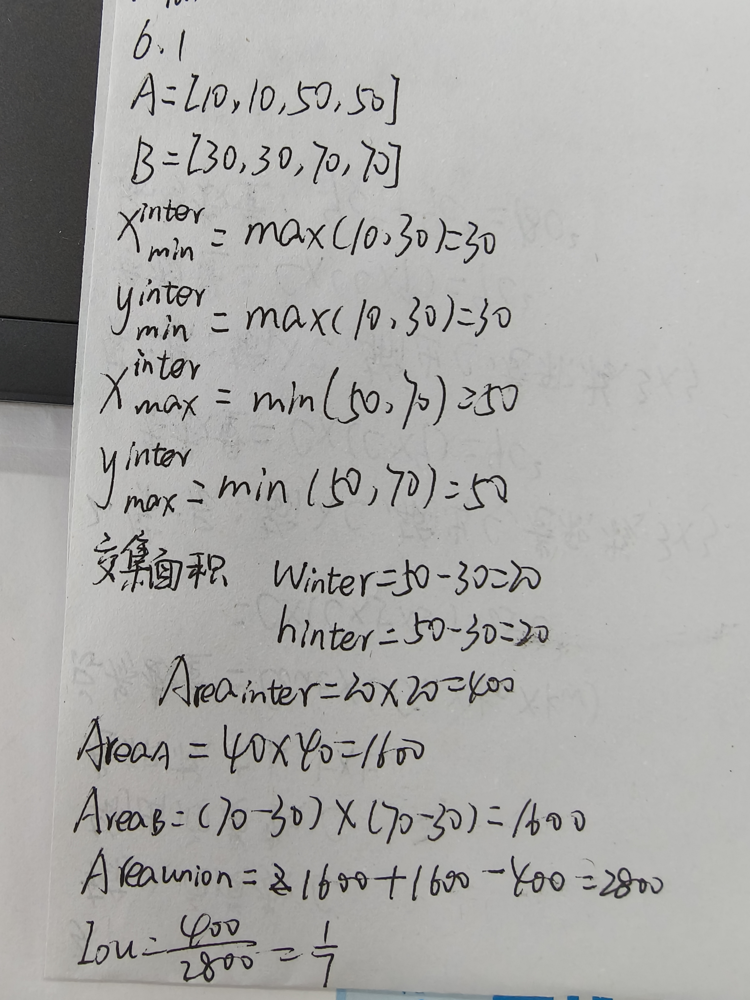

6.2编程题

In [28]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class LabelSmoothingCrossEntropy(nn.Module):
    """
    标签平滑交叉熵损失
    Args:
        epsilon: 平滑因子，默认 0.1
        reduction: 'mean' 或 'sum' 或 'none'
    """
    def __init__(self, epsilon=0.1, reduction='mean'):
        super(LabelSmoothingCrossEntropy, self).__init__()
        self.epsilon = epsilon
        self.reduction = reduction
    
    def forward(self, logits, targets):
        """
        Args:
            logits: 模型输出，形状 (batch_size, num_classes)
            targets: 真实标签，形状 (batch_size,)
        Returns:
            损失值
        """
        num_classes = logits.size(-1)
        
        # 创建平滑后的标签分布
        # 真实类别概率 = 1 - epsilon，其他类别概率 = epsilon / (num_classes - 1)
        smooth_labels = torch.zeros_like(logits).fill_(self.epsilon / (num_classes - 1))
        smooth_labels.scatter_(1, targets.unsqueeze(1), 1.0 - self.epsilon)
        
        # 计算交叉熵损失
        log_probs = F.log_softmax(logits, dim=-1)
        loss = -torch.sum(smooth_labels * log_probs, dim=-1)
        
        if self.reduction == 'mean':
            return loss.mean()
        elif self.reduction == 'sum':
            return loss.sum()
        else:
            return loss

In [29]:
if __name__ == "__main__":
    # 设置参数
    batch_size = 4
    num_classes = 10
    epsilon = 0.1
    
    # 创建损失函数实例
    criterion = LabelSmoothingCrossEntropy(epsilon=epsilon, reduction='mean')
    
    # 模拟模型输出（logits）和真实标签
    logits = torch.randn(batch_size, num_classes)
    targets = torch.tensor([2, 5, 1, 8])  # 真实类别
    
    # 计算损失
    loss = criterion(logits, targets)
    
    # 输出结果
    print("=" * 50)
    print("标签平滑交叉熵损失测试")
    print("=" * 50)
    print(f"Batch size: {batch_size}")
    print(f"类别数: {num_classes}")
    print(f"平滑因子 ε: {epsilon}")
    print(f"真实标签: {targets.tolist()}")
    print(f"\n损失值: {loss.item():.6f}")
    
    # 对比标准交叉熵
    standard_criterion = nn.CrossEntropyLoss()
    standard_loss = standard_criterion(logits, targets)
    print(f"\n标准交叉熵损失: {standard_loss.item():.6f}")
    
    # 显示平滑后的标签分布
    smooth_labels = torch.zeros(batch_size, num_classes)
    smooth_labels.fill_(epsilon / (num_classes - 1))
    smooth_labels.scatter_(1, targets.unsqueeze(1), 1.0 - epsilon)
    
    print(f"\n平滑后的标签分布（第1个样本）:")
    print(f"  真实类别 {targets[0]} 的概率: {smooth_labels[0, targets[0]]:.4f}")
    print(f"  其他类别概率: {smooth_labels[0, 0]:.4f}")

标签平滑交叉熵损失测试
Batch size: 4
类别数: 10
平滑因子 ε: 0.1
真实标签: [2, 5, 1, 8]

损失值: 2.533832

标准交叉熵损失: 2.502854

平滑后的标签分布（第1个样本）:
  真实类别 2 的概率: 0.9000
  其他类别概率: 0.0111
